Step 1: Mount Google Drive and List Contents


In [1]:
from google.colab import drive
drive.mount('/content/drive')
!ls


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
drive  sample_data  vit.py


Step 2: Unzip the Dataset

In [2]:
!unzip "/content/drive/MyDrive/AL AMIN/Lung Cancer/colon image.zip"


Archive:  /content/drive/MyDrive/AL AMIN/Lung Cancer/colon image.zip
   creating: colon image/
   creating: colon image/training 2/
   creating: colon image/training 2/lung_aca/
  inflating: colon image/training 2/lung_aca/lungaca1.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca10.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca100.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1000.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1001.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1002.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1003.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1004.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1005.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1006.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1007.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1008.jpeg  
  inflating: colon image/training 2/lung_aca/lungaca1009.jpe

Step 3: Change Directory to the Dataset Location

In [3]:
import os
os.chdir("/content/colon image/training 2")


Step 4: Install Necessary Packages

In [4]:
!pip install patchify


Step 5: Import Necessary Libraries

In [5]:
import os
import numpy as np
import cv2
from glob import glob
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from patchify import patchify
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping
from vit import ViT
import shutil
import matplotlib.pyplot as plt


Step 6: Define Hyperparameters

In [6]:
hp = {}
hp["image_size"] = 200
hp["num_channels"] = 3
hp["patch_size"] = 25
hp["num_patches"] = (hp["image_size"]**2) // (hp["patch_size"]**2)
hp["flat_patches_shape"] = (hp["num_patches"], hp["patch_size"]*hp["patch_size"]*hp["num_channels"])

hp["batch_size"] = 32
hp["lr"] = 1e-4
hp["num_epochs"] = 20
hp["num_classes"] = 3
hp["class_names"] = ["lung_aca", "lung_n", "lung_scc"]

hp["num_layers"] = 12
hp["hidden_dim"] = 768
hp["mlp_dim"] = 3072
hp["num_heads"] = 12
hp["dropout_rate"] = 0.1

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)


Step 7: Load Dataset and Split into Client Folders

In [7]:
def load_data_and_split_into_clients(path, client_paths, split=0.33):
    images = shuffle(glob(os.path.join(path, "*", "*.jpeg")))

    split_size = int(len(images) * split)
    client_1, temp = train_test_split(images, test_size=2*split_size, random_state=42)
    client_2, client_3 = train_test_split(temp, test_size=0.5, random_state=42)

    clients = [client_1, client_2, client_3]

    for i, client_images in enumerate(clients):
        for image_path in client_images:
            class_name = image_path.split("/")[-2]
            dest_dir = os.path.join(client_paths[i], class_name)
            create_dir(dest_dir)
            shutil.copy(image_path, dest_dir)

client_paths = ["/content/client_1", "/content/client_2", "/content/client_3"]
for path in client_paths:
    create_dir(path)

load_data_and_split_into_clients("/content/colon image/training 2", client_paths)


Step 8: Define Encryption Functions

In [8]:
class BlockScramble:
    def __init__(self, key):
        self.key = key

    def Scramble(self, block):
        np.random.seed(self.key)
        np.random.shuffle(block)
        return block

def blockwise_scramble(patches, key=None):
    num_patches, patch_size, patch_size, channels = patches.shape
    scrambled_patches = np.zeros_like(patches)
    bs = BlockScramble(key)

    for i in range(num_patches):
        scrambled_patches[i, :, :, :] = bs.Scramble(patches[i, :, :, :].reshape(-1, channels)).reshape(patch_size, patch_size, channels)

    return scrambled_patches

def shuffle_block_positions(patches, key):
    np.random.seed(key)
    num_patches = patches.shape[0]
    indices = np.arange(num_patches)
    np.random.shuffle(indices)
    return patches[indices]

def encrypt_patches(patches, key):
    scrambled_patches = blockwise_scramble(patches, key=key)
    shuffled_patches = shuffle_block_positions(scrambled_patches, key=key)
    return shuffled_patches



In [39]:
import random

def negative_positive_transformation(image, key):
    """
    Apply negative-positive transformation to each pixel of each color channel.
    Reduced strength by applying transformation only to a subset of pixels.
    """
    transformed_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:  # Apply transformation to only 50% of the pixels
                for k in range(image.shape[2]):
                    r = random.randint(0, 1)  # Generate a random binary integer
                    if r == 0:
                        transformed_image[i, j, k] = image[i, j, k]
                    else:
                        transformed_image[i, j, k] = 255 - image[i, j, k]  # Assuming 8-bit image (0-255)
    return transformed_image

def color_shuffling(image, key):
    """
    Shuffle three color components of each pixel using a key.
    Reduced strength by shuffling only a subset of pixels.
    """
    shuffled_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:  # Shuffle colors of only 50% of the pixels
                shuffle_order = key % 6
                if shuffle_order == 1:
                    shuffled_image[i, j] = image[i, j, [1, 2, 0]]  # R -> G, G -> B, B -> R
                elif shuffle_order == 2:
                    shuffled_image[i, j] = image[i, j, [2, 0, 1]]  # R -> B, G -> R, B -> G
                elif shuffle_order == 3:
                    shuffled_image[i, j] = image[i, j, [2, 1, 0]]  # R -> B, G -> G, B -> R
                elif shuffle_order == 4:
                    shuffled_image[i, j] = image[i, j, [1, 0, 2]]  # R -> G, G -> R, B -> B
                elif shuffle_order == 5:
                    shuffled_image[i, j] = image[i, j, [0, 2, 1]]  # R -> R, G -> B, B -> G
    return shuffled_image

def encrypt_patches(patches):
    """
    Encrypt patches using block-wise image scrambling and pixel-wise encryption.
    """
    encrypted_patches = patches.copy()
    for i in range(len(encrypted_patches)):
        encrypted_patches[i] = blockwise_scramble(encrypted_patches[i])
        encrypted_patches[i] = negative_positive_transformation(encrypted_patches[i], key=42)  # Example key
        encrypted_patches[i] = color_shuffling(encrypted_patches[i], key=42)  # Example key
    return encrypted_patches

Step 9: Encrypt Each Client's Dataset with Different Keys

In [9]:
def process_image_label_with_key(path, key):
    path = path.decode()
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (hp["image_size"], hp["image_size"]))
    image = image / 255.0

    patch_shape = (hp["patch_size"], hp["patch_size"], hp["num_channels"])
    patches = patchify(image, patch_shape, hp["patch_size"])

    patches = encrypt_patches(patches, key)

    patches = np.reshape(patches, hp["flat_patches_shape"])
    patches = patches.astype(np.float32)

    class_name = path.split("/")[-2]
    class_idx = hp["class_names"].index(class_name)
    class_idx = np.array(class_idx, dtype=np.int32)

    return patches, class_idx


Step 10: Visualize and Verify the Scrambling Patterns

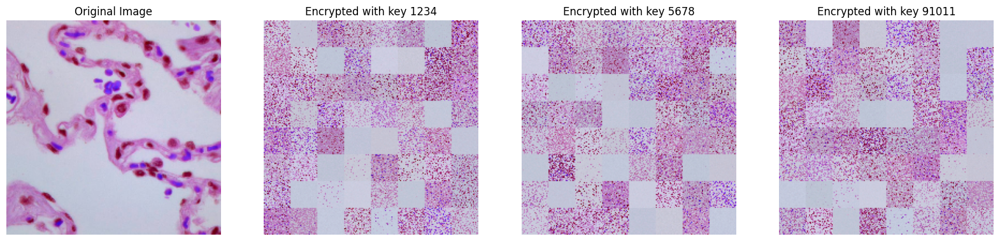

In [10]:
def visualize_scrambling(image_path, keys):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (hp["image_size"], hp["image_size"]))
    image = image / 255.0

    patch_shape = (hp["patch_size"], hp["patch_size"], hp["num_channels"])
    patches = patchify(image, patch_shape, hp["patch_size"])

    # Reshape patches to expected shape
    patches = patches.reshape(-1, hp["patch_size"], hp["patch_size"], hp["num_channels"])

    fig, axes = plt.subplots(1, len(keys) + 1, figsize=(20, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    for i, key in enumerate(keys):
        encrypted_patches = encrypt_patches(patches, key)
        encrypted_image = np.zeros((hp["image_size"], hp["image_size"], hp["num_channels"]))

        idx = 0
        for row in range(8):
            for col in range(8):
                encrypted_image[row*hp["patch_size"]:(row+1)*hp["patch_size"], col*hp["patch_size"]:(col+1)*hp["patch_size"], :] = encrypted_patches[idx, :, :, :]
                idx += 1

        axes[i + 1].imshow(encrypted_image)
        axes[i + 1].set_title(f"Encrypted with key {key}")
        axes[i + 1].axis('off')

    plt.show()

# Define keys for three clients
client_keys = [1234, 5678, 91011]

# Visualize the scrambling patterns for a sample image
sample_image_path = '/content/client_1/lung_n/lungn1001.jpeg'
visualize_scrambling(sample_image_path, client_keys)



Step 11: Create Master Dataset

In [11]:
def create_master_dataset(client_paths, master_path):
    create_dir(master_path)
    for client_path in client_paths:
        for class_dir in os.listdir(client_path):
            class_path = os.path.join(client_path, class_dir)
            for image_file in os.listdir(class_path):
                src_path = os.path.join(class_path, image_file)
                dest_dir = os.path.join(master_path, class_dir)
                create_dir(dest_dir)
                shutil.copy(src_path, dest_dir)

master_path = "/content/master_dataset"
create_master_dataset(client_paths, master_path)



Step 12: Load Data from Master Dataset

In [12]:
def load_master_data(path, split=0.1):
    images = shuffle(glob(os.path.join(path, "*", "*.jpeg")))

    split_size = int(len(images) * split)
    train_x, valid_x = train_test_split(images, test_size=split_size, random_state=42)
    train_x, test_x = train_test_split(train_x, test_size=split_size, random_state=42)

    return train_x, valid_x, test_x

train_x, valid_x, test_x = load_master_data(master_path)
print(f"Train: {len(train_x)} - Valid: {len(valid_x)} - Test: {len(test_x)}")



Train: 2649 - Valid: 331 - Test: 331


Step 13: Process Image and Label for TensorFlow Dataset

In [13]:
def process_image_label(path, key):
    path = path.decode()
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (hp["image_size"], hp["image_size"]))
    image = image / 255.0

    patch_shape = (hp["patch_size"], hp["patch_size"], hp["num_channels"])
    patches = patchify(image, patch_shape, hp["patch_size"])

    patches = patches.reshape(-1, hp["patch_size"], hp["patch_size"], hp["num_channels"])
    patches = encrypt_patches(patches, key)

    patches = np.reshape(patches, hp["flat_patches_shape"])
    patches = patches.astype(np.float32)

    class_name = path.split("/")[-2]
    class_idx = hp["class_names"].index(class_name)
    class_idx = np.array(class_idx, dtype=np.int32)

    return patches, class_idx



Step 14: Create TensorFlow Dataset

In [14]:
def parse(path, key):
    patches, labels = tf.numpy_function(process_image_label, [path, key], [tf.float32, tf.int32])
    labels = tf.one_hot(labels, hp["num_classes"])

    patches.set_shape(hp["flat_patches_shape"])
    labels.set_shape(hp["num_classes"])

    return patches, labels

def tf_dataset(images, key, batch=64):
    ds = tf.data.Dataset.from_tensor_slices((images))
    ds = ds.map(lambda x: parse(x, key)).batch(batch).prefetch(8)
    return ds



Step 15: Set Seeds and Create Directories

In [15]:
np.random.seed(42)
tf.random.set_seed(42)

create_dir("files")

model_path = os.path.join("files", "model.keras")
csv_path = os.path.join("files", "log.csv")


Step 16: Define Encryption Keys for Clients and Combine Data

In [16]:
client_keys = [1234, 5678, 91011]

# Apply keys to each client dataset
train_ds = tf_dataset(train_x, client_keys[0], batch=hp["batch_size"])
valid_ds = tf_dataset(valid_x, client_keys[1], batch=hp["batch_size"])
test_ds = tf_dataset(test_x, client_keys[2], batch=hp["batch_size"])

print("Size of train_ds", train_ds)
print("Size of valid_ds", valid_ds)
print("Size of test_ds", test_ds)



Size of train_ds <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 1875), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))>
Size of valid_ds <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 1875), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))>
Size of test_ds <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 1875), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))>


Step 17: Install Additional Packages

In [17]:
!pip install matplotlib reportlab


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.4/199.4 kB 4.6 MB/s eta 0:00:00


Step 18: Define Custom Callback for Tracking Training Time

In [18]:
import time
from tensorflow.keras.callbacks import Callback

class TimeHistory(Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
        print(f"Epoch {epoch+1} took {self.times[-1]:.2f} seconds")

time_callback = TimeHistory()



Step 19: Compile and Train the Model

In [19]:
model = ViT(hp)
model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(hp["lr"], clipvalue=1.0),
    metrics=["ACC"]
)

callbacks = [
    time_callback,
    ModelCheckpoint(model_path, monitor="val_loss", verbose=1, save_best_only=True),
    CSVLogger(csv_path),
    ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=5, min_lr=1e-7, verbose=1),
    EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=False)
]

history = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=hp["num_epochs"],
    callbacks=callbacks
)

# Print total training time
total_time = sum(time_callback.times)
print(f"Total training time: {total_time:.2f} seconds")


Epoch 1/20
83/83 [==============================] - ETA: 0s - loss: 1.2385 - ACC: 0.5221Epoch 1 took 838.73 seconds

Epoch 1: val_loss improved from inf to 0.41816, saving model to files/model.keras
83/83 [==============================] - 852s 10s/step - loss: 1.2385 - ACC: 0.5221 - val_loss: 0.4182 - val_ACC: 0.7855 - lr: 1.0000e-04
Epoch 2/20
83/83 [==============================] - ETA: 0s - loss: 0.4344 - ACC: 0.8131Epoch 2 took 817.25 seconds

Epoch 2: val_loss did not improve from 0.41816
83/83 [==============================] - 817s 10s/step - loss: 0.4344 - ACC: 0.8131 - val_loss: 0.4334 - val_ACC: 0.7372 - lr: 1.0000e-04
Epoch 3/20
83/83 [==============================] - ETA: 0s - loss: 0.4199 - ACC: 0.8146Epoch 3 took 815.32 seconds

Epoch 3: val_loss improved from 0.41816 to 0.23512, saving model to files/model.keras
83/83 [==============================] - 856s 10s/step - loss: 0.4199 - ACC: 0.8146 - val_loss: 0.2351 - val_ACC: 0.9063 - lr: 1.0000e-04
Epoch 4/20
83/83 [==

Confusion Matrix

In [24]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
import io

# Updated class names
# hp["class_names"] = ["lung_aca", "lung_n", "lung_scc"]

# Evaluate the model on the test set
test_ds = tf_dataset(test_x, client_keys[2], batch=hp["batch_size"])  # Ensure correct key is used for the test set
y_true = []
y_pred = []

for images, labels in test_ds:
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    preds = model.predict(images)
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Visualize the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', xticklabels=hp["class_names"], yticklabels=hp["class_names"], cbar_kws={'ticks': [0, 50, 100, 150]})
plt.xlabel('Predicted', fontsize=12, fontweight='bold')
plt.ylabel('True', fontsize=12, fontweight='bold')
plt.title('ViT Encrypted Confusion Matrix', fontsize=14, fontweight='bold')

# Save the confusion matrix plot to an in-memory buffer
buf = io.BytesIO()
plt.savefig(buf, format='png')
plt.close()
buf.seek(0)
img = ImageReader(buf)

# Create a PDF for the confusion matrix
pdf_file = "/content/colon image/training 2/confusion_matrix_report.pdf"
c = canvas.Canvas(pdf_file, pagesize=letter)
c.setFont("Helvetica-Bold", 14)
c.drawImage(img, 15, 500, width=580, height=280)
c.save()

# Output the file path for the generated PDF
print(f"PDF report saved to: {pdf_file}")


1/1 [==============================] - 1s 995ms/step
PDF report saved to: /content/colon image/training 2/confusion_matrix_report.pdf


In [25]:
!pip install matplotlib reportlab patchify requests

The training and validation loss and accuracy curves

In [28]:
import matplotlib.pyplot as plt
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
import io

# Inspect the keys in the history dictionary
print(history.history.keys())

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['ACC'], label='Training Accuracy', color='green', linewidth=2)
plt.plot(history.history['val_ACC'], label='Validation Accuracy', color='blue', linewidth=2)
plt.title('ViT Encrypted Model Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Epoch', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12, fontweight='bold')
plt.legend(loc='upper left')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', color='red', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='orange', linewidth=2)
plt.title('ViT Encrypted Model Loss', fontsize=14, fontweight='bold')
plt.xlabel('Epoch', fontsize=12, fontweight='bold')
plt.ylabel('Loss', fontsize=12, fontweight='bold')
plt.legend(loc='upper right')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')

plt.tight_layout()

# Save the plot to an in-memory buffer
buf = io.BytesIO()
plt.savefig(buf, format='png')
plt.close()
buf.seek(0)
img = ImageReader(buf)

# Create a PDF for the plots
pdf_file = "/content/colon image/training 2/training_validation_plots.pdf"
c = canvas.Canvas(pdf_file, pagesize=letter)
c.setFont("Helvetica-Bold", 14)
c.drawImage(img, 15, 400, width=580, height=380)
c.save()

# Output the file path for the generated PDF
print(f"PDF report saved to: {pdf_file}")


dict_keys(['loss', 'ACC', 'val_loss', 'val_ACC', 'lr'])
PDF report saved to: /content/colon image/training 2/training_validation_plots.pdf


ROC CURVE

In [32]:
import numpy as np
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from itertools import cycle
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
import io

# Adjust class names if necessary
hp["class_names"] = ["lung_aca", "lung_n", "lung_scc"]  # Adjust as per your dataset

# Define the key to be used for encryption/decryption
key = 1234  # Replace with the actual key you want to use

# Correctly load test_ds with the key argument
test_ds = tf_dataset(test_x, key=key, batch=hp["batch_size"])

# Calculate ROC curves and AUC for each class
y_true = []
y_pred = []

for images, labels in test_ds:
    y_true.extend(labels.numpy())
    preds = model.predict(images)
    y_pred.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(hp["num_classes"]):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot ROC curve
plt.figure(figsize=(12, 8))

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(hp["num_classes"]), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(hp["class_names"][i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=13, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=13, fontweight='bold')
plt.title('ViT Encrypted ROC Curve', fontsize=13, fontweight='bold')
plt.legend(loc="lower right", fontsize=13)
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=13, fontweight='bold')

plt.tight_layout()

# Save the plot to an in-memory buffer
buf = io.BytesIO()
plt.savefig(buf, format='png')
plt.close()
buf.seek(0)
img = ImageReader(buf)

# Create a PDF for the ROC curve
pdf_file = "/content/colon image/training 2/roc_curve.pdf"
c = canvas.Canvas(pdf_file, pagesize=letter)
c.setFont("Helvetica-Bold", 13)
c.drawImage(img, 15, 500, width=580, height=280)
c.save()

# Output the file path for the generated PDF
print(f"PDF report saved to: {pdf_file}")


1/1 [==============================] - 1s 1s/step
PDF report saved to: /content/colon image/training 2/roc_curve.pdf


Generating Patch Images with Encryption for Secure Medical Data Processing

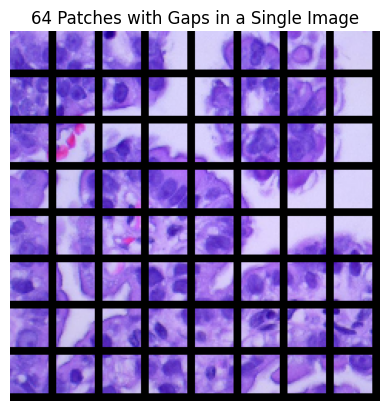

PDF report saved to: image_comparison.pdf


In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import view_as_blocks
from io import BytesIO
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader

# BlockScramble definition
class BlockScramble:
    def __init__(self, key_file):
        pass

    def Scramble(self, block):
        np.random.shuffle(block)
        return block

# Function to load and preprocess the image
def load_and_preprocess_image(image_path, image_size=200):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    resized_image = cv2.resize(image, (image_size, image_size))
    return resized_image

# Function to generate the patch image with gaps
def generate_patch_image_with_gaps(image, patch_size=25, gap=5):
    patches = view_as_blocks(image, block_shape=(patch_size, patch_size, 3)).reshape(-1, patch_size, patch_size, 3)
    patches_rgb = [cv2.cvtColor(patch, cv2.COLOR_BGR2RGB) for patch in patches]

    grid_size = image.shape[0] // patch_size
    patch_display = np.zeros(((patch_size + gap) * grid_size, (patch_size + gap) * grid_size, 3), dtype=np.uint8)

    for i, patch_rgb in enumerate(patches_rgb):
        row = (i // grid_size) * (patch_size + gap)
        col = (i % grid_size) * (patch_size + gap)
        patch_display[row:row+patch_size, col:col+patch_size] = patch_rgb

    return patch_display

# Function to encrypt image
def encrypt_image(image, patch_size=25):
    patches = view_as_blocks(image, block_shape=(patch_size, patch_size, 3)).reshape(-1, patch_size, patch_size, 3)
    encrypted_patches = [BlockScramble('key_placeholder').Scramble(patch) for patch in patches]
    encrypted_image = np.zeros_like(image)

    grid_size = image.shape[0] // patch_size
    for i, patch in enumerate(encrypted_patches):
        row = (i // grid_size) * patch_size
        col = (i % grid_size) * patch_size
        encrypted_image[row:row+patch_size, col:col+patch_size] = patch

    return encrypted_image

# Function to create PDF with images
def create_pdf(original_img, patch_img, encrypted_img, pdf_path="image_comparison.pdf"):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image", fontsize=13, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(patch_img)
    axes[1].set_title("Patch Image", fontsize=13, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(cv2.cvtColor(encrypted_img, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Encrypted Image", fontsize=13, fontweight='bold')
    axes[2].axis('off')

    buf = BytesIO()
    plt.savefig(buf, format='png')
    plt.close()
    buf.seek(0)
    img = ImageReader(buf)

    c = canvas.Canvas(pdf_path, pagesize=letter)
    c.drawString(250, 700, "Image Comparison")
    c.drawImage(img, 15, 200, width=580, height=400)
    c.save()

    print(f"PDF report saved to: {pdf_path}")

# Example usage
image_path = '/content/colon image/training 2/lung_aca/lungaca10.jpeg'
original_image = load_and_preprocess_image(image_path)
patch_image = generate_patch_image_with_gaps(original_image)
encrypted_image = encrypt_image(original_image)

# Display the patch image
plt.imshow(patch_image)
plt.title("64 Patches with Gaps in a Single Image")
plt.axis('off')
plt.show()

# Create and save the PDF
create_pdf(original_image, patch_image, encrypted_image)

Loading and preprocessing time: 0.0032 seconds
Patch image generation time: 0.0009 seconds
Image encryption time: 0.0026 seconds


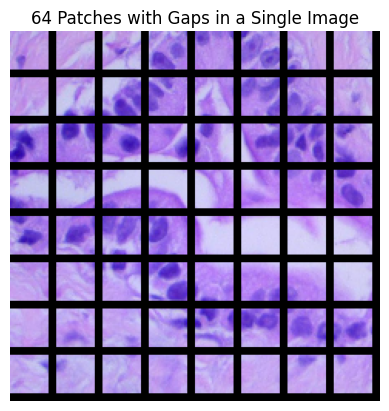

PDF creation time: 0.8055 seconds
PDF report saved to: image_comparison.pdf


In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import view_as_blocks
from io import BytesIO
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.utils import ImageReader
import time

# BlockScramble definition
class BlockScramble:
    def __init__(self, key_file):
        pass

    def Scramble(self, block):
        np.random.shuffle(block)
        return block

# Function to load and preprocess the image
def load_and_preprocess_image(image_path, image_size=200):
    start_time = time.time()
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    resized_image = cv2.resize(image, (image_size, image_size))
    end_time = time.time()
    print(f"Loading and preprocessing time: {end_time - start_time:.4f} seconds")
    return resized_image

# Function to generate the patch image with gaps
def generate_patch_image_with_gaps(image, patch_size=25, gap=5):
    start_time = time.time()
    patches = view_as_blocks(image, block_shape=(patch_size, patch_size, 3)).reshape(-1, patch_size, patch_size, 3)
    patches_rgb = [cv2.cvtColor(patch, cv2.COLOR_BGR2RGB) for patch in patches]

    grid_size = image.shape[0] // patch_size
    patch_display = np.zeros(((patch_size + gap) * grid_size, (patch_size + gap) * grid_size, 3), dtype=np.uint8)

    for i, patch_rgb in enumerate(patches_rgb):
        row = (i // grid_size) * (patch_size + gap)
        col = (i % grid_size) * (patch_size + gap)
        patch_display[row:row+patch_size, col:col+patch_size] = patch_rgb

    end_time = time.time()
    print(f"Patch image generation time: {end_time - start_time:.4f} seconds")
    return patch_display

# Function to encrypt image
def encrypt_image(image, patch_size=25):
    start_time = time.time()
    patches = view_as_blocks(image, block_shape=(patch_size, patch_size, 3)).reshape(-1, patch_size, patch_size, 3)
    encrypted_patches = [BlockScramble('key_placeholder').Scramble(patch) for patch in patches]
    encrypted_image = np.zeros_like(image)

    grid_size = image.shape[0] // patch_size
    for i, patch in enumerate(encrypted_patches):
        row = (i // grid_size) * patch_size
        col = (i % grid_size) * patch_size
        encrypted_image[row:row+patch_size, col:col+patch_size] = patch

    end_time = time.time()
    print(f"Image encryption time: {end_time - start_time:.4f} seconds")
    return encrypted_image

# Function to create PDF with images
def create_pdf(original_img, patch_img, encrypted_img, pdf_path="image_comparison.pdf"):
    start_time = time.time()
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Original Image", fontsize=13, fontweight='bold')
    axes[0].axis('off')

    axes[1].imshow(patch_img)
    axes[1].set_title("Patch Image", fontsize=13, fontweight='bold')
    axes[1].axis('off')

    axes[2].imshow(cv2.cvtColor(encrypted_img, cv2.COLOR_BGR2RGB))
    axes[2].set_title("Encrypted Image", fontsize=13, fontweight='bold')
    axes[2].axis('off')

    buf = BytesIO()
    plt.savefig(buf, format='png')
    plt.close()
    buf.seek(0)
    img = ImageReader(buf)

    c = canvas.Canvas(pdf_path, pagesize=letter)
    c.drawString(250, 700, "Image Comparison")
    c.drawImage(img, 15, 200, width=580, height=400)
    c.save()

    end_time = time.time()
    print(f"PDF creation time: {end_time - start_time:.4f} seconds")
    print(f"PDF report saved to: {pdf_path}")

# Example usage
image_path = '/content/colon image/training 2/lung_aca/lungaca100.jpeg'
original_image = load_and_preprocess_image(image_path)
patch_image = generate_patch_image_with_gaps(original_image)
encrypted_image = encrypt_image(original_image)

# Display the patch image
plt.imshow(patch_image)
plt.title("64 Patches with Gaps in a Single Image")
plt.axis('off')
plt.show()

# Create and save the PDF
create_pdf(original_image, patch_image, encrypted_image)

Adversarial Attack Visualization: Patching and Encrypting Images for Secure Medical Data Processing

Bit-flip Attack

<ipython-input-36-6b65431d1d96>:32: UserWarning: you are shuffling a 'flatiter' object which is not a subclass of 'Sequence'; `shuffle` is not guaranteed to behave correctly. E.g., non-numpy array/tensor objects with view semantics may contain duplicates after shuffling.
  np.random.shuffle(scrambled_patches[i].flat)


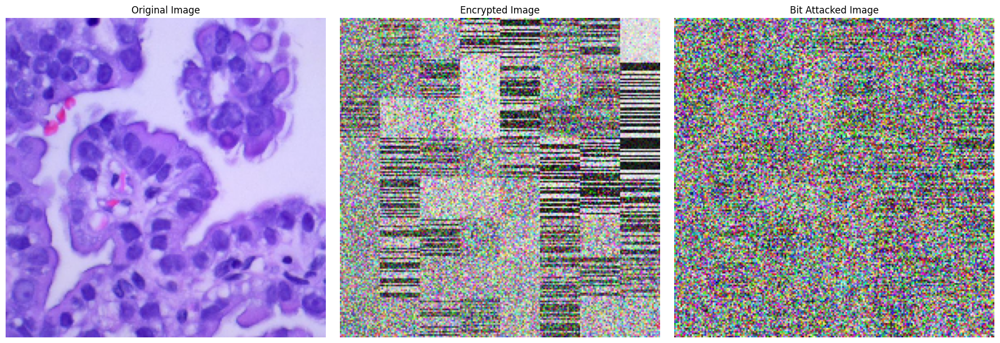

In [36]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import random

# Function to apply bit-flip attack on an image
def bit_flip_attack(image, num_bits=4):
    attacked_image = image.copy()
    h, w, c = attacked_image.shape

    for i in range(h):
        for j in range(w):
            for k in range(c):
                pixel_value = attacked_image[i, j, k]
                pixel_bin = np.binary_repr(pixel_value, width=8)
                pixel_bin = list(pixel_bin)

                for _ in range(num_bits):
                    bit_to_flip = np.random.randint(0, 8)
                    pixel_bin[bit_to_flip] = '1' if pixel_bin[bit_to_flip] == '0' else '0'

                pixel_bin = ''.join(pixel_bin)
                attacked_image[i, j, k] = int(pixel_bin, 2)

    return attacked_image

# Placeholder blockwise scramble function
def blockwise_scramble(patches):
    scrambled_patches = patches.copy()
    for i in range(patches.shape[0]):
        np.random.shuffle(scrambled_patches[i].flat)
    return scrambled_patches

# Placeholder negative-positive transformation function
def negative_positive_transformation(image, key):
    transformed_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:
                for k in range(image.shape[2]):
                    r = random.randint(0, 1)
                    if r == 0:
                        transformed_image[i, j, k] = image[i, j, k]
                    else:
                        transformed_image[i, j, k] = 255 - image[i, j, k]
    return transformed_image

# Placeholder color shuffling function
def color_shuffling(image, key):
    shuffled_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:
                shuffle_order = key % 6
                if shuffle_order == 1:
                    shuffled_image[i, j] = image[i, j, [1, 2, 0]]
                elif shuffle_order == 2:
                    shuffled_image[i, j] = image[i, j, [2, 0, 1]]
                elif shuffle_order == 3:
                    shuffled_image[i, j] = image[i, j, [2, 1, 0]]
                elif shuffle_order == 4:
                    shuffled_image[i, j] = image[i, j, [1, 0, 2]]
                elif shuffle_order == 5:
                    shuffled_image[i, j] = image[i, j, [0, 2, 1]]
    return shuffled_image

def encrypt_patches(patches):
    encrypted_patches = patches.copy()
    for i in range(len(encrypted_patches)):
        encrypted_patches[i] = blockwise_scramble(encrypted_patches[i])
        encrypted_patches[i] = negative_positive_transformation(encrypted_patches[i], key=42)
        encrypted_patches[i] = color_shuffling(encrypted_patches[i], key=42)
    return encrypted_patches

# Path to your image
image_path = '/content/colon image/training 2/lung_aca/lungaca10.jpeg'

# Read the image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Ensure the image size is compatible with patch size
hp = {
    "image_size": 200,
    "patch_size": 25,
    "num_channels": 3
}
image = cv2.resize(image, (hp["image_size"], hp["image_size"]))

# Preprocess to patches
patch_shape = (hp["patch_size"], hp["patch_size"], hp["num_channels"])
patches = patchify(image, patch_shape, hp["patch_size"])

# Encrypt the patches
encrypted_patches = encrypt_patches(patches)

# Reconstruct the encrypted image from patches
encrypted_image = unpatchify(encrypted_patches, (hp["image_size"], hp["image_size"], hp["num_channels"]))

# Apply the bit-flip attack
num_bits_to_flip = 4
attacked_image = bit_flip_attack(encrypted_image, num_bits=num_bits_to_flip)

# Display the original, encrypted, and attacked images
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(encrypted_image)
plt.title('Encrypted Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(attacked_image)
plt.title('Bit Attacked Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Gaussian Noise Attack

<ipython-input-37-467c65c2c35e>:38: UserWarning: you are shuffling a 'flatiter' object which is not a subclass of 'Sequence'; `shuffle` is not guaranteed to behave correctly. E.g., non-numpy array/tensor objects with view semantics may contain duplicates after shuffling.
  np.random.shuffle(scrambled_patches[i].flat)


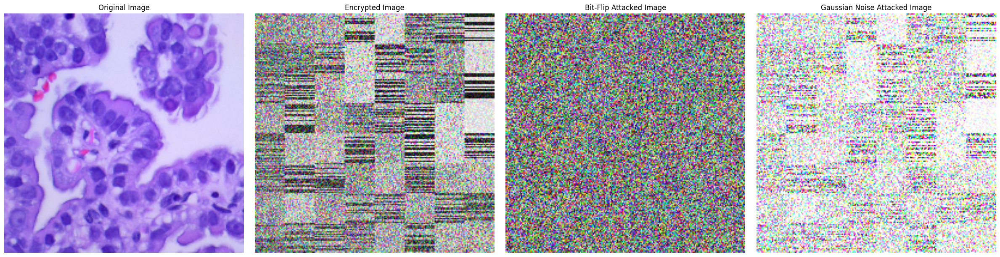

In [37]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import random

# Function to apply bit-flip attack on an image
def bit_flip_attack(image, num_bits=4):
    attacked_image = image.copy()
    h, w, c = attacked_image.shape

    for i in range(h):
        for j in range(w):
            for k in range(c):
                pixel_value = attacked_image[i, j, k]
                pixel_bin = np.binary_repr(pixel_value, width=8)
                pixel_bin = list(pixel_bin)

                for _ in range(num_bits):
                    bit_to_flip = np.random.randint(0, 8)
                    pixel_bin[bit_to_flip] = '1' if pixel_bin[bit_to_flip] == '0' else '0'

                pixel_bin = ''.join(pixel_bin)
                attacked_image[i, j, k] = int(pixel_bin, 2)

    return attacked_image

# Function to apply Gaussian noise attack on an image
def gaussian_noise_attack(image, mean=0, std=25):
    noise = np.random.normal(mean, std, image.shape).astype(np.uint8)
    attacked_image = cv2.add(image, noise)
    return attacked_image

# Placeholder blockwise scramble function
def blockwise_scramble(patches):
    scrambled_patches = patches.copy()
    for i in range(patches.shape[0]):
        np.random.shuffle(scrambled_patches[i].flat)
    return scrambled_patches

# Placeholder negative-positive transformation function
def negative_positive_transformation(image, key):
    transformed_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:
                for k in range(image.shape[2]):
                    r = random.randint(0, 1)
                    if r == 0:
                        transformed_image[i, j, k] = image[i, j, k]
                    else:
                        transformed_image[i, j, k] = 255 - image[i, j, k]
    return transformed_image

# Placeholder color shuffling function
def color_shuffling(image, key):
    shuffled_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:
                shuffle_order = key % 6
                if shuffle_order == 1:
                    shuffled_image[i, j] = image[i, j, [1, 2, 0]]
                elif shuffle_order == 2:
                    shuffled_image[i, j] = image[i, j, [2, 0, 1]]
                elif shuffle_order == 3:
                    shuffled_image[i, j] = image[i, j, [2, 1, 0]]
                elif shuffle_order == 4:
                    shuffled_image[i, j] = image[i, j, [1, 0, 2]]
                elif shuffle_order == 5:
                    shuffled_image[i, j] = image[i, j, [0, 2, 1]]
    return shuffled_image

def encrypt_patches(patches):
    encrypted_patches = patches.copy()
    for i in range(len(encrypted_patches)):
        encrypted_patches[i] = blockwise_scramble(encrypted_patches[i])
        encrypted_patches[i] = negative_positive_transformation(encrypted_patches[i], key=42)
        encrypted_patches[i] = color_shuffling(encrypted_patches[i], key=42)
    return encrypted_patches

# Path to your image
image_path = '/content/colon image/training 2/lung_aca/lungaca10.jpeg'

# Read the image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Ensure the image size is compatible with patch size
hp = {
    "image_size": 200,
    "patch_size": 25,
    "num_channels": 3
}
image = cv2.resize(image, (hp["image_size"], hp["image_size"]))

# Preprocess to patches
patch_shape = (hp["patch_size"], hp["patch_size"], hp["num_channels"])
patches = patchify(image, patch_shape, hp["patch_size"])

# Encrypt the patches
encrypted_patches = encrypt_patches(patches)

# Reconstruct the encrypted image from patches
encrypted_image = unpatchify(encrypted_patches, (hp["image_size"], hp["image_size"], hp["num_channels"]))

# Apply the bit-flip attack
num_bits_to_flip = 8
bit_flip_attacked_image = bit_flip_attack(encrypted_image, num_bits=num_bits_to_flip)

# Apply the Gaussian noise attack
gaussian_noise_attacked_image = gaussian_noise_attack(encrypted_image)

# Display the original, encrypted, bit-flip attacked, and Gaussian noise attacked images
plt.figure(figsize=(24, 6))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(encrypted_image)
plt.title('Encrypted Image')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(bit_flip_attacked_image)
plt.title('Bit-Flip Attacked Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(gaussian_noise_attacked_image)
plt.title('Gaussian Noise Attacked Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Gaussian Blur Attack

<ipython-input-38-799dcd638953>:37: UserWarning: you are shuffling a 'flatiter' object which is not a subclass of 'Sequence'; `shuffle` is not guaranteed to behave correctly. E.g., non-numpy array/tensor objects with view semantics may contain duplicates after shuffling.
  np.random.shuffle(scrambled_patches[i].flat)


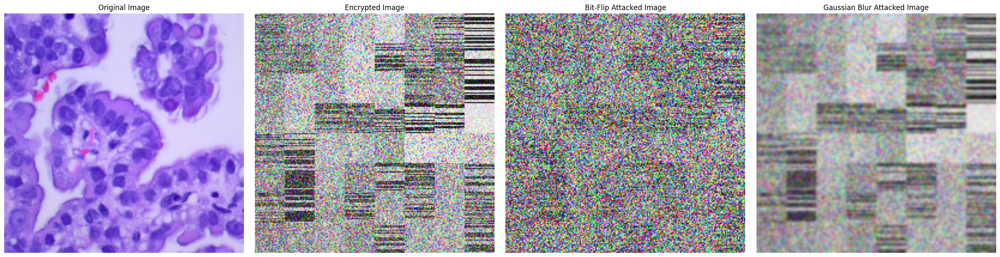

In [38]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import random

# Function to apply bit-flip attack on an image
def bit_flip_attack(image, num_bits=4):
    attacked_image = image.copy()
    h, w, c = attacked_image.shape

    for i in range(h):
        for j in range(w):
            for k in range(c):
                pixel_value = attacked_image[i, j, k]
                pixel_bin = np.binary_repr(pixel_value, width=8)
                pixel_bin = list(pixel_bin)

                for _ in range(num_bits):
                    bit_to_flip = np.random.randint(0, 8)
                    pixel_bin[bit_to_flip] = '1' if pixel_bin[bit_to_flip] == '0' else '0'

                pixel_bin = ''.join(pixel_bin)
                attacked_image[i, j, k] = int(pixel_bin, 2)

    return attacked_image

# Function to apply Gaussian blur attack on an image
def gaussian_blur_attack(image, kernel_size=(5, 5), sigma=1.0):
    attacked_image = cv2.GaussianBlur(image, kernel_size, sigma)
    return attacked_image

# Placeholder blockwise scramble function
def blockwise_scramble(patches):
    scrambled_patches = patches.copy()
    for i in range(patches.shape[0]):
        np.random.shuffle(scrambled_patches[i].flat)
    return scrambled_patches

# Placeholder negative-positive transformation function
def negative_positive_transformation(image, key):
    transformed_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:
                for k in range(image.shape[2]):
                    r = random.randint(0, 1)
                    if r == 0:
                        transformed_image[i, j, k] = image[i, j, k]
                    else:
                        transformed_image[i, j, k] = 255 - image[i, j, k]
    return transformed_image

# Placeholder color shuffling function
def color_shuffling(image, key):
    shuffled_image = image.copy()
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if random.random() > 0.5:
                shuffle_order = key % 6
                if shuffle_order == 1:
                    shuffled_image[i, j] = image[i, j, [1, 2, 0]]
                elif shuffle_order == 2:
                    shuffled_image[i, j] = image[i, j, [2, 0, 1]]
                elif shuffle_order == 3:
                    shuffled_image[i, j] = image[i, j, [2, 1, 0]]
                elif shuffle_order == 4:
                    shuffled_image[i, j] = image[i, j, [1, 0, 2]]
                elif shuffle_order == 5:
                    shuffled_image[i, j] = image[i, j, [0, 2, 1]]
    return shuffled_image

def encrypt_patches(patches):
    encrypted_patches = patches.copy()
    for i in range(len(encrypted_patches)):
        encrypted_patches[i] = blockwise_scramble(encrypted_patches[i])
        encrypted_patches[i] = negative_positive_transformation(encrypted_patches[i], key=42)
        encrypted_patches[i] = color_shuffling(encrypted_patches[i], key=42)
    return encrypted_patches

# Path to your image
image_path = '/content/colon image/training 2/lung_aca/lungaca10.jpeg'

# Read the image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Ensure the image size is compatible with patch size
hp = {
    "image_size": 200,
    "patch_size": 25,
    "num_channels": 3
}
image = cv2.resize(image, (hp["image_size"], hp["image_size"]))

# Preprocess to patches
patch_shape = (hp["patch_size"], hp["patch_size"], hp["num_channels"])
patches = patchify(image, patch_shape, hp["patch_size"])

# Encrypt the patches
encrypted_patches = encrypt_patches(patches)

# Reconstruct the encrypted image from patches
encrypted_image = unpatchify(encrypted_patches, (hp["image_size"], hp["image_size"], hp["num_channels"]))

# Apply the bit-flip attack
num_bits_to_flip = 4
bit_flip_attacked_image = bit_flip_attack(encrypted_image, num_bits=num_bits_to_flip)

# Apply the Gaussian blur attack
gaussian_blur_attacked_image = gaussian_blur_attack(encrypted_image)

# Display the original, encrypted, bit-flip attacked, and Gaussian blur attacked images
plt.figure(figsize=(24, 6))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(encrypted_image)
plt.title('Encrypted Image')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(bit_flip_attacked_image)
plt.title('Bit-Flip Attacked Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(gaussian_blur_attacked_image)
plt.title('Gaussian Blur Attacked Image')
plt.axis('off')

plt.tight_layout()
plt.show()